# Detection: Test Your Model on Images Showing Objects in Background

### Pipeline
1. Load & display images
2. Extract ORB keypoints/descriptors
3. Visualise **all** raw keypoints (red)
4. Apply NMS
5. Visualise **retained** keypoints (green)
6. Save the NMS‑pruned descriptors (`.npy`) and keypoint metadata (`.csv`)

**Dependencies**: `opencv-python`, `numpy`, `matplotlib`.

In [31]:
# import modules
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import os

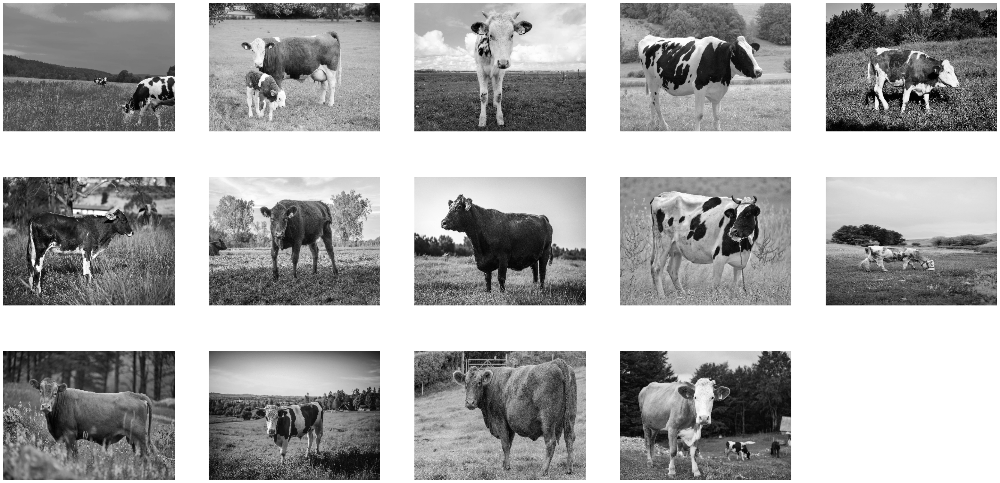

In [32]:
# 1. Load & display images
bg_and_cow_features_path = "features/bg_and_cow_features/"
file_names = os.listdir('images/cows_and_bgs')
cow_and_bg_imgs = [cv.imread(f'images/cows_and_bgs/{file_name}', cv.IMREAD_GRAYSCALE) for file_name in file_names]
cow_and_bg_imgs = [cv.resize(img, (400, 300)) for img in cow_and_bg_imgs]

def showImages(imgs, rows=1, cols=10, cmap="gray"):
    fig = plt.figure(figsize=(40, 20))
    for i, img in enumerate(imgs, 1):
        fig.add_subplot(rows, cols, i)
        plt.imshow(img, cmap=cmap)
        plt.axis("off")
    plt.show()

showImages(cow_and_bg_imgs, rows=3, cols=5)        

In [33]:
# 2. Extract keypoints/descriptors
sift = cv.ORB_create(nfeatures=1000) # nfeatures=1000
kp_dsp = [sift.detectAndCompute(cow_img, None) for cow_img in cow_and_bg_imgs] # keypoints & descriptors
keypoints = [kp[0] for kp in kp_dsp]
descriptors = [kp[1] for kp in kp_dsp]

print([len(kp_data) for kp_data in keypoints])

[785, 969, 898, 972, 986, 972, 969, 883, 975, 949, 917, 987, 908, 940]


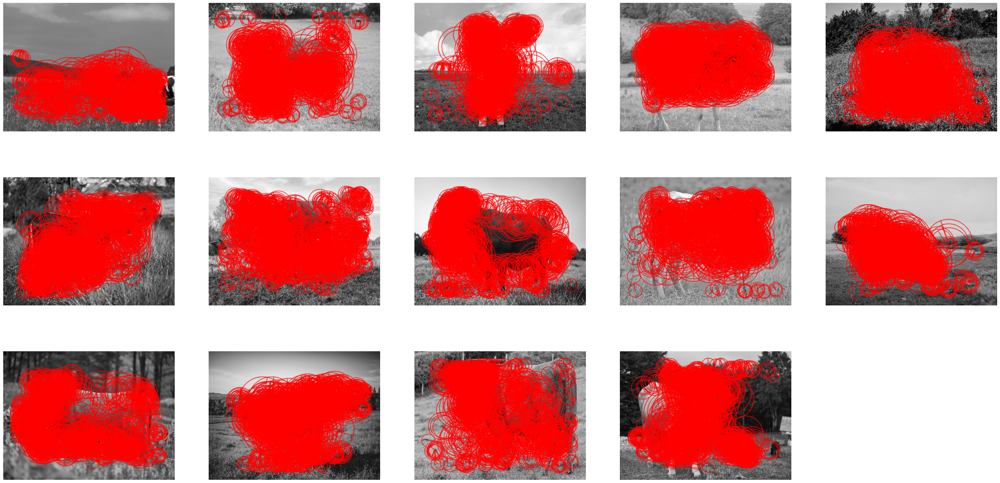

In [34]:
# 3. Visualise all raw keypoints
keypoint_imgs = [cv.drawKeypoints(img, keypoint, np.zeros(img.shape), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(255, 0, 0)) for img, keypoint in zip(cow_and_bg_imgs, keypoints)]
showImages(keypoint_imgs, rows=3, cols=5)

In [35]:
# 4. Apply NMS

euclidian = lambda kp1, kp2: np.sqrt(((kp1.pt[0] - kp2.pt[0]) ** 2) + ((kp1.pt[1] - kp2.pt[1]) ** 2))

def applyNMS(keypoints, descriptors):

  all_keypoints = []
  all_descriptors = []

  # iterate over every image
  for kp_data, dp_data in zip(keypoints, descriptors):

    # iterate over every single keypoint
    sorted_responses = np.argsort([kp.response for kp in kp_data])
    sorted_kp_np = np.array(kp_data)[sorted_responses]
    sorted_dp_np = np.array(dp_data)[sorted_responses]

    cleaned_keypoints = []
    cleaned_descriptors = []

    sorted_kp = sorted_kp_np.tolist()
    sorted_dp = sorted_dp_np.tolist()

    while sorted_kp:

      fixed_kp = sorted_kp.pop(0)
      fixed_dp = sorted_dp.pop(0)
      threshold = fixed_kp.size / 2

      cleaned_keypoints.append(fixed_kp)
      cleaned_descriptors.append(fixed_dp)

      indices_to_delete = []

      for i, curr_kp in enumerate(sorted_kp):
        distance = euclidian(fixed_kp, curr_kp)

        # print(distance, threshold)
        if distance < threshold:
          indices_to_delete.append(i)

      # delete keypoints which are too close
      for i in sorted(indices_to_delete, reverse=True):
        sorted_kp.pop(i)
        sorted_dp.pop(i)

    all_keypoints.append(cleaned_keypoints)
    all_descriptors.append(cleaned_descriptors)

  return all_keypoints, all_descriptors

keypoints_nms, descriptors_nms = applyNMS(keypoints, descriptors)

kp_len = [len(kp_data) for kp_data in keypoints_nms]
dp_len = [len(dp_data) for dp_data in descriptors_nms]
assert kp_len == dp_len
print(kp_len)

[35, 30, 35, 18, 39, 27, 36, 29, 33, 23, 27, 23, 42, 31]


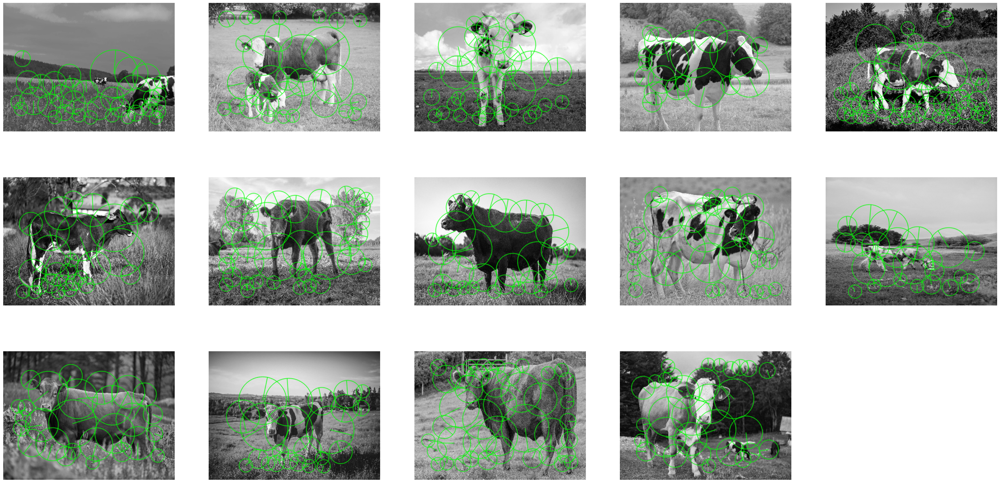

In [49]:
# 5. Visualise retained keypoints
cow_and_bg_imgs_nms = [cv.drawKeypoints(img, kp_data, np.zeros(img.shape), flags=cv.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS, color=(0, 255, 0)) for img, kp_data in zip(cow_and_bg_imgs, keypoints_nms)]
showImages(cow_and_bg_imgs_nms, rows=3, cols=5)

In [37]:
# 6. Save the NMS‑pruned descriptors and keypoint metadata
def saveNMSData(path, keypoints, descriptors):
    # transform keypoints into numpy array
    transformed = []
    
    for kp_data in keypoints:
        sub = [[kp.pt, kp.size, kp.angle, kp.response, kp.octave, kp.class_id] for kp in kp_data]
        transformed.append(sub)

    np.save(f"{path}keypoints_nms.npz", np.array(transformed, dtype=object))
    np.save(f"{path}descriptors_nms.npz", np.array(descriptors, dtype=object))
    print("NMS Keypoints and Descriptors successfully saved.")

def loadNMSData(path):

    temp = np.load(f"{path}keypoints_nms.npz.npy", allow_pickle=True)
    descriptors_nms = np.load(f"{path}descriptors_nms.npz.npy", allow_pickle=True)
    keypoints_nms = []

    for tmp in temp:
        kp_data = [cv.KeyPoint(
            x=kp[0][0], 
            y=kp[0][1], 
            size=kp[1], 
            angle=kp[2],
            response=kp[3],
            octave=kp[4],
            class_id=kp[5]
        ) for kp in tmp]
        keypoints_nms.append(kp_data)

    print("NMS Keypoints and Descriptors successfully loaded.")
    return keypoints_nms, descriptors_nms

saveNMSData(bg_and_cow_features_path, keypoints_nms, descriptors_nms)

NMS Keypoints and Descriptors successfully saved.


## Load object & background cluster models
Load model data:
- **Object** clusters: `orb_allfeatures_cow/cluster_centers.npy` and their displacement lists `cluster_displacements.json`.
- **Background** clusters: `orb_allfeatures_background_images/cluster_centers.npy`.

Executed once before processing test images.

In [48]:
# 16. Load object & background cluster models
import json

def loadClustersAndDPVS(path):

    per_image_labels = np.load(f"{path}image_labels.npz.npy", allow_pickle=True)
    cluster_centers = np.load(f"{path}cluster_centers.npz.npy", allow_pickle=True)
    dpvs = np.load(f"{path}dpvs.npz.npy", allow_pickle=True)
    print("Sucessfully loaded clustering and displacement-vector data.")

    return per_image_labels, cluster_centers, dpvs

def loadEnrichedData(path):

    total_data = len(os.listdir(f"{path}enriched_data"))
    enriched_data = [np.load(f"{path}enriched_data/data_{i}.npz.npy", allow_pickle=True).tolist() for i in range(total_data)]

    with open(f"{path}cluster_displacements.json") as f:
        data = json.load(f).values()
        cluster_displacements = [dpvs for dpvs in data]

    return enriched_data, cluster_displacements

cow_features_path = "features/cow_features/"
bg_features_path = "features/bg_features/"

per_image_labels1, cluster_centers1, dpvs1 = loadClustersAndDPVS(cow_features_path)
per_image_labels2, cluster_centers2, dpvs2 = loadClustersAndDPVS(bg_features_path)

enriched_data1, cluster_displacements1 = loadEnrichedData(cow_features_path)
enriched_data2, cluster_displacements2 = loadEnrichedData(bg_features_path)

print(f"Loaded {len(cluster_centers1)} cow and {len(cluster_centers2)} background clusters.")

Sucessfully loaded clustering and displacement-vector data.
Sucessfully loaded clustering and displacement-vector data.
Loaded 16 cow and 27 background clusters.


## Assign test keypoint feature descriptors to nearest cluster (codebook entry / visual word) and keep object keypoints only

In [46]:
# 17. Assign test keypoint feature descriptorss to nearest cluster (codebook entry / visual word) and keep object keypoints only
for kp_data, dp_data in zip(keypoints_nms, descriptors_nms):
    pass
print(cluster_centers1)


[[94.55172729492188 70.37931060791016 132.6896514892578
  142.65516662597656 111.62068939208984 51.68965530395508
  142.34483337402344 77.17241668701172 86.79310607910156
  190.55172729492188 146.96551513671875 201.27586364746094
  162.3103485107422 42.31034469604492 166.65516662597656
  144.6206817626953 119.96551513671875 132.51724243164062
  101.82758331298828 159.96551513671875 182.55172729492188
  185.65516662597656 106.4137954711914 127.03448486328125
  125.3448257446289 148.20689392089844 165.3103485107422
  148.41378784179688 121.68965148925781 181.27586364746094
  105.17241668701172 141.89654541015625]
 [73.4000015258789 152.75999450683594 186.59999084472656
  174.83999633789062 184.0 193.8000030517578 174.239990234375
  147.75999450683594 74.91999816894531 132.44000244140625
  110.5999984741211 179.75999450683594 77.4000015258789
  175.51998901367188 169.0 135.0800018310547 164.27999877929688
  135.47999572753906 173.83999633789062 149.0800018310547
  161.27999877929688 165.0

## Voting procedure

Visualise object votes (displacement vectors from cluster). 

Here it is done on the test images and not on the training images only. So this is the application of the Implicit Shape Model to real data.

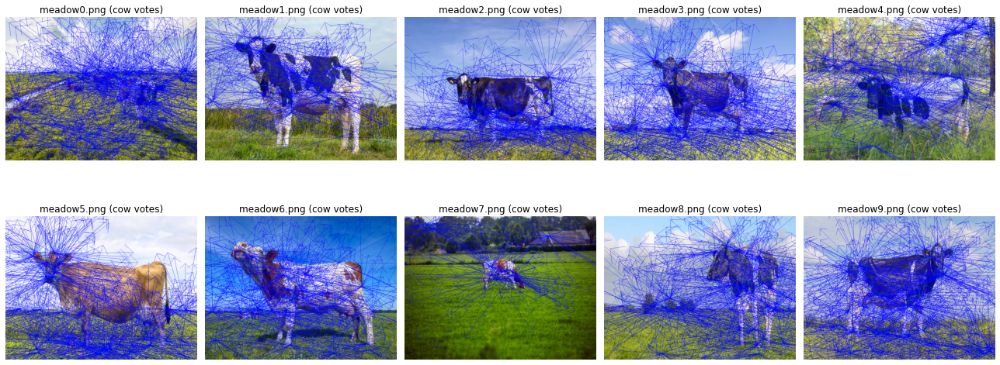

In [9]:
# 18. Visualise object votes (same as in training jupyter notebook)

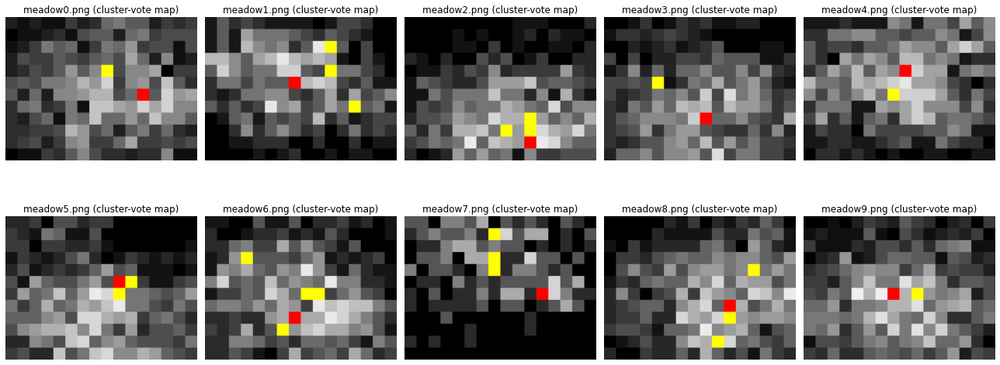

In [10]:
# 19. Cast votes to low resolution grid bins and visualize (same as in training jupyter notebook)

# Discussion

Discuss the achievements of you **prototype** Implicit Shape Model:

- Are the result reasonable in principle?
- What are the deficits?
- Suggest improvements:
    - Does your approach make use of an angle or a direction of the keypoint?
    - If not, what would you need to change?
    - Does your approach make use of a size or scale of the keypoint?
    - If not, what would you need to change?
    - What are the implications concerning rotations or size/scale changes of your images?
    - Can you reduce the complexity of your task by providing other training and test data?
    
If you have the time, try to realize some of the suggested improvements.